# Implement SARSA

**Sarsa算法**：针对一个状态 S，个体通过行为策略产生一个行为 A，执行该行为进而产生一个状态行为对 (S,A)，环境收到个体的行为后会告诉个体即时奖励R 以及后续进入的状态 S’；个体在状态 S’ 时遵循当前的行为策略产生一个新行为 A’，个体此时并不执行该行为，而是通过行为价值函数得到后一个状态行为对 (S’,A’) 的价值，利用这个新的价值和即时奖励 R 来更新前一个状态行为对 (S,A) 的价值。  

迭代公式：
$$
Q(S, A) \leftarrow Q(S, A)+\alpha\left(R+\gamma Q\left(S^{\prime}, A^{\prime}\right)-Q(S, A)\right)
$$
​		

​		**Sarsa算法流程**：参数 α 是学习速率参数， γ 是衰减因子。

![](https://cdn.mathpix.com/snip/images/oLt-qSY8emhlm_dN78xWznXgEbhDlzRSWIX1tsKLHS8.original.fullsize.png)

In [4]:
%matplotlib inline

import gym
import itertools
import matplotlib
import numpy as np
import pandas as pd
import sys

if "../" not in sys.path:
    sys.path.append("../") 

from collections import defaultdict
from lib.envs.windy_gridworld import WindyGridworldEnv
from lib import plotting

matplotlib.style.use('ggplot')

In [5]:
env = WindyGridworldEnv()

In [14]:
def make_epsilon_greedy_policy(Q, epsilon, nA):
    """
    Creates an epsilon-greedy policy based on a given Q-function and epsilon.
    
    Args:
        Q: A dictionary that maps from state -> action-values.
            Each value is a numpy array of length nA (see below)
        epsilon: The probability to select a random action . float between 0 and 1.
        nA: Number of actions in the environment.
    
    Returns:
        A function that takes the observation as an argument and returns
        the probabilities for each action in the form of a numpy array of length nA.
    
    """
    def policy_fn(observation):
        A = np.ones(nA, dtype=float) * epsilon / nA
        best_action = np.argmax(Q[observation])
        A[best_action] += (1.0 - epsilon)
        return A
    return policy_fn

In [15]:
def sarsa(env, num_episodes, discount_factor=1.0, alpha=0.5, epsilon=0.1):
    """
    SARSA algorithm: On-policy TD control. Finds the optimal epsilon-greedy policy.
    
    Args:
        env: OpenAI environment.
        num_episodes: Number of episodes to run for.
        discount_factor: Gamma discount factor.
        alpha: TD learning rate.
        epsilon: Chance the sample a random action. Float betwen 0 and 1.
    
    Returns:
        A tuple (Q, stats).
        Q is the optimal action-value function, a dictionary mapping state -> action values.
        stats is an EpisodeStats object with two numpy arrays for episode_lengths and episode_rewards.
    """
    
    # The final action-value function.
    # A nested dictionary that maps state -> (action -> action-value).
    Q = defaultdict(lambda: np.zeros(env.action_space.n))
    
    # Keeps track of useful statistics
    stats = plotting.EpisodeStats(
        episode_lengths=np.zeros(num_episodes),
        episode_rewards=np.zeros(num_episodes))

    # The policy we're following
    policy = make_epsilon_greedy_policy(Q, epsilon, env.action_space.n)
    
    for i_episode in range(num_episodes):
        # Print out which episode we're on, useful for debugging.
        if (i_episode + 1) % 100 == 0:
            print("\rEpisode {}/{}.".format(i_episode + 1, num_episodes), end="")
            sys.stdout.flush()
        
        # Reset the environment and pick the first action
        state = env.reset()
        action_probs = policy(state)
        action = np.random.choice(np.arange(len(action_probs)), p=action_probs)
        
        # One step in the environment
        for t in itertools.count():
            # Take a step
            next_state, reward, done, _ = env.step(action)
            
            # Pick the next action
            next_action_probs = policy(next_state)
            next_action = np.random.choice(np.arange(len(next_action_probs)), p=next_action_probs)
            
            # Update statistics
            stats.episode_rewards[i_episode] += reward
            stats.episode_lengths[i_episode] = t
            
            # TD Update
            td_target = reward + discount_factor * Q[next_state][next_action]
            td_delta = td_target - Q[state][action]
            Q[state][action] += alpha * td_delta
    
            if done:
                break
                
            action = next_action
            state = next_state
    return Q, stats

In [16]:
Q, stats = sarsa(env, 200)

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {})
defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([0., 0., 0., 0.])})
defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([0., 0., 0., 0.])})
defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([-0.5,  0. ,  0. ,  0. ]), 10: array([0., 0., 0., 0.])})
defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([-0.5,  0. ,  0. ,  0. ]), 10: array([-0.5,  0. ,  0. ,  0. ]), 0: array([0., 0., 0., 0.])})
defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([-0.5,  0. ,  0. ,  0. ]), 10: array([-0.5,  0. ,  0. ,  0. ]), 0: array([-0.5,  0. ,  0. ,  0. ])})
defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([-0.5,  0. ,  0. ,  0. ]), 10: array([-0.5, -0.5,  0. ,  0. ]), 0: array([-0.75, -0.5 , -0.5 ,  0.  ]), 1: array([-0.75, -0.5 , -0.5 , -0.5 ]), 2: array([-0.75, -0.5 , -0.5 , -0.5 ]), 3: array([-0.75, -1.  , -0.75, -0.5 ]), 4: array([-0.75, -0.75, -0.75, -0.5 ]), 5: array([-1.25, -1.  , -1.  , -0.5 ]), 12: array([-0.5, -0.5,  0. ,  0. ]), 11: array([-0.5, -0.5,  0. ,  0. ]), 13: array([-0.75,  0.  ,  0.  ,  0.  ]), 6: array([-0.75, -0.75, -0.75, -1.  ]), 7: array([-0.75, -1.  , -1.25, -1.  ]), 8: array([-1.5  , -1.125, -1.5  , -1.125]), 9: array([-1.5   , -1.5625, -1.1875, -0.875 ]), 19: array([-0.875, -0.75 , -0.75 , -1.   ]), 18: array([-1.125, -0.875,  0.   ,  0.   ]), 29: array([-0.75, -0.75, -0.75,  0.  ]), 39: array([-0.75, -0.75, -0.5 , -0.5 ]), 49: array([-0.5,  0. ,  0. ,  0. ]), 38: array([-0.5,  0. ,  0. ,  0. ])})
defaultdict(<function sarsa.<locals>.<lambda

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([-0.5,  0. ,  0. ,  0. ]), 10: array([-0.5, -0.5,  0. ,  0. ]), 0: array([-0.75, -0.5 , -0.5 ,  0.  ]), 1: array([-0.75 , -1.125, -0.5  , -0.5  ]), 2: array([-1.125, -1.25 , -1.125, -1.   ]), 3: array([-1.625 , -1.6875, -0.75  , -1.25  ]), 4: array([-1.5   , -1.8125, -1.625 , -1.375 ]), 5: array([-2.0625, -1.8125, -1.75  , -1.375 ]), 12: array([-1.125, -0.75 , -0.5  , -0.5  ]), 11: array([-0.5, -1. , -0.5,  0. ]), 13: array([-0.75 , -0.875,  0.   ,  0.   ]), 6: array([-1.5  , -1.25 , -1.625, -1.5  ]), 7: array([-1.5    , -2.03125, -1.625  , -1.375  ]), 8: array([-2.25    , -2.      , -2.421875, -1.921875]), 9: array([-1.84375, -1.5625 , -1.46875, -1.5    ]), 19: array([-0.875, -1.5  , -0.875, -1.   ]), 18: array([-1.125, -0.875,  0.   ,  0.   ]), 29: array([-0.75, -0.75, -0.75, -0.5 ]), 39: array([-0.75, -0.75, -0.5 , -0.5 ]), 49: array([-0.5,  0. ,  0. ,  0. ]), 38: ar

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5,  0. ,  0. ,  0. ]), 20: array([-0.5, -0.5,  0. ,  0. ]), 10: array([-0.5, -1. , -0.5,  0. ]), 0: array([-0.75 , -1.125, -0.75 , -1.   ]), 1: array([-1.5  , -1.125, -1.   , -1.125]), 2: array([-1.875  , -1.25   , -1.40625, -1.25   ]), 3: array([-2.375   , -2.09375 , -2.546875, -2.09375 ]), 4: array([-2.40625 , -2.28125 , -2.515625, -2.3125  ]), 5: array([-2.0625 , -2.21875, -2.53125, -2.21875]), 12: array([-1.125, -0.75 , -0.75 , -0.75 ]), 11: array([-1.  , -1.  , -0.75, -0.75]), 13: array([-0.75 , -0.875,  0.   ,  0.   ]), 6: array([-2.59375, -2.15625, -2.46875, -2.40625]), 7: array([-2.3125 , -2.03125, -2.53125, -2.59375]), 8: array([-2.25    , -2.      , -2.421875, -1.921875]), 9: array([-1.84375, -1.5625 , -1.46875, -1.5    ]), 19: array([-0.875, -1.5  , -0.875, -1.   ]), 18: array([-1.125, -0.875,  0.   ,  0.   ]), 29: array([-0.75, -0.75, -0.75, -0.5 ]), 39: array([-0.75, -0.75, -0.5 , -0.5 ]),

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5, -1. , -0.5,  0. ]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.125, -1.   , -1.125, -1.   ]), 0: array([-1.375, -1.125, -1.125, -1.375]), 1: array([-1.5  , -1.125, -1.375, -1.125]), 2: array([-1.875   , -2.171875, -1.40625 , -1.625   ]), 3: array([-2.375   , -2.6875  , -2.546875, -2.171875]), 4: array([-2.40625 , -2.671875, -2.515625, -2.703125]), 5: array([-2.890625, -2.6875  , -2.53125 , -2.765625]), 12: array([-1.125, -0.75 , -0.75 , -1.25 ]), 11: array([-1.   , -1.   , -1.125, -0.875]), 13: array([-0.75 , -0.875, -0.75 , -1.125]), 6: array([-2.59375, -2.59375, -2.46875, -2.8125 ]), 7: array([-2.953125 , -2.4765625, -2.53125  , -3.       ]), 8: array([-2.25     , -2.       , -2.421875 , -2.6171875]), 9: array([-1.84375, -1.5625 , -1.46875, -1.5    ]), 19: array([-0.875, -1.5  , -0.875, -1.   ]), 18: array([-1.125, -0.875,  0.   ,  0.   ]), 29: array([-0.75, -0.75, -0.75, -0.5 ]), 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5 , -1.  , -0.75, -0.75]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.125, -1.5  , -1.125, -1.   ]), 0: array([-1.375, -1.75 , -1.125, -1.375]), 1: array([-1.5     , -1.765625, -1.6875  , -1.625   ]), 2: array([-1.875    , -2.171875 , -1.7578125, -1.875    ]), 3: array([-2.375   , -2.6875  , -2.546875, -2.46875 ]), 4: array([-3.2109375, -2.671875 , -2.515625 , -2.703125 ]), 5: array([-2.890625, -2.6875  , -2.53125 , -2.765625]), 12: array([-1.875, -1.25 , -1.125, -1.25 ]), 11: array([-1.5625, -1.375 , -1.125 , -1.4375]), 13: array([-1.9609375, -0.875    , -0.75     , -1.125    ]), 6: array([-2.59375, -2.59375, -2.46875, -2.8125 ]), 7: array([-2.953125 , -2.4765625, -2.53125  , -3.       ]), 8: array([-2.25     , -2.       , -2.421875 , -2.6171875]), 9: array([-1.84375, -1.5625 , -1.46875, -1.5    ]), 19: array([-0.875, -1.5  , -0.875, -1.   ]), 18: array([-1.125, -0.875,  0.   ,  0.   ]

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5 , -1.  , -0.75, -0.75]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.125, -1.5  , -1.125, -1.   ]), 0: array([-1.375, -1.75 , -1.125, -1.375]), 1: array([-1.5     , -1.765625, -1.6875  , -1.625   ]), 2: array([-1.875    , -2.171875 , -1.7578125, -1.875    ]), 3: array([-2.375   , -2.6875  , -2.546875, -2.46875 ]), 4: array([-3.2109375, -3.1015625, -3.34375  , -2.703125 ]), 5: array([-2.890625, -3.078125, -3.359375, -2.765625]), 12: array([-1.875, -1.25 , -1.125, -1.25 ]), 11: array([-1.5625, -1.375 , -1.125 , -1.4375]), 13: array([-1.9609375, -0.875    , -0.75     , -1.125    ]), 6: array([-3.34375   , -3.03515625, -3.03125   , -2.8125    ]), 7: array([-2.953125  , -2.99414062, -3.38476562, -3.        ]), 8: array([-3.07421875, -2.81152344, -3.25390625, -2.6171875 ]), 9: array([-2.61523438, -2.3671875 , -2.25292969, -2.3671875 ]), 19: array([-1.6875 , -1.5    , -1.46875, -1.75   ]), 18

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5 , -1.  , -0.75, -0.75]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.125, -1.5  , -1.125, -1.   ]), 0: array([-1.375, -1.75 , -1.125, -1.375]), 1: array([-1.5     , -1.765625, -1.6875  , -1.625   ]), 2: array([-1.875     , -2.859375  , -1.94140625, -1.875     ]), 3: array([-3.171875  , -3.36328125, -3.3671875 , -2.7890625 ]), 4: array([-3.2109375, -3.1015625, -3.34375  , -3.4296875]), 5: array([-3.390625, -3.078125, -3.359375, -3.234375]), 12: array([-1.875 , -1.25  , -1.4375, -1.6875]), 11: array([-1.5625, -1.375 , -1.4375, -1.4375]), 13: array([-1.9609375, -0.875    , -0.75     , -1.125    ]), 6: array([-3.34375   , -3.03515625, -3.03125   , -3.2890625 ]), 7: array([-3.4765625 , -2.99414062, -3.38476562, -3.40625   ]), 8: array([-3.07421875, -2.81152344, -3.25390625, -2.6171875 ]), 9: array([-2.61523438, -2.3671875 , -2.25292969, -2.3671875 ]), 19: array([-1.6875  , -1.5     , -1.609

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5 , -1.  , -0.75, -0.75]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.125, -1.5  , -1.125, -1.   ]), 0: array([-1.375, -1.75 , -1.125, -1.375]), 1: array([-1.5     , -1.765625, -1.6875  , -1.625   ]), 2: array([-1.875     , -2.859375  , -1.94140625, -1.875     ]), 3: array([-3.171875  , -3.36328125, -3.3671875 , -2.7890625 ]), 4: array([-3.2109375, -3.1015625, -3.34375  , -3.4296875]), 5: array([-3.734375 , -3.5546875, -3.359375 , -3.234375 ]), 12: array([-1.875 , -1.25  , -1.4375, -1.6875]), 11: array([-1.5625, -1.375 , -1.4375, -1.4375]), 13: array([-1.9609375, -0.875    , -0.75     , -1.125    ]), 6: array([-3.34375   , -3.70996094, -3.78320312, -3.2890625 ]), 7: array([-3.4765625 , -3.55859375, -3.68945312, -3.40625   ]), 8: array([-3.88696289, -3.45166016, -4.02099609, -3.46142578]), 9: array([-3.37615967, -3.1171875 , -2.78533936, -3.22070312]), 19: array([-2.60974121, -2.3046875 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5 , -1.  , -0.75, -0.75]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.125, -1.5  , -1.125, -1.   ]), 0: array([-1.375, -1.75 , -1.125, -1.375]), 1: array([-1.5     , -1.765625, -1.6875  , -1.625   ]), 2: array([-1.875     , -2.859375  , -1.94140625, -1.875     ]), 3: array([-3.171875  , -3.36328125, -3.3671875 , -2.7890625 ]), 4: array([-3.2109375 , -3.73046875, -3.34375   , -3.4296875 ]), 5: array([-3.734375  , -3.94921875, -4.20703125, -3.66796875]), 12: array([-1.875 , -1.25  , -1.4375, -1.6875]), 11: array([-1.5625, -1.375 , -1.4375, -1.4375]), 13: array([-1.9609375, -0.875    , -0.75     , -1.125    ]), 6: array([-4.27685547, -4.09326172, -3.78320312, -3.76171875]), 7: array([-4.26757812, -4.00512695, -4.51855469, -3.84765625]), 8: array([-3.88696289, -3.68730164, -4.02099609, -3.46142578]), 9: array([-3.37615967, -3.1171875 , -3.03959656, -3.22070312]), 19: array([-2.60974121, -2.

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-0.5 , -1.  , -0.75, -0.75]), 20: array([-1.125, -1.   , -0.75 , -1.   ]), 10: array([-1.75  , -1.5   , -1.125 , -1.8125]), 0: array([-2.0625 , -2.21875, -1.5625 , -1.375  ]), 1: array([-2.3125  , -1.765625, -2.03125 , -1.875   ]), 2: array([-2.375     , -2.859375  , -2.18945312, -2.1875    ]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.03710938]), 4: array([-4.02734375, -4.23242188, -4.13671875, -3.8515625 ]), 5: array([-4.58691406, -3.94921875, -4.20703125, -4.37011719]), 12: array([-1.875  , -1.5    , -1.65625, -1.6875 ]), 11: array([-1.5625, -1.8125, -1.4375, -1.4375]), 13: array([-1.9609375 , -2.80273438, -1.5625    , -1.125     ]), 6: array([-4.27685547, -4.09326172, -3.78320312, -4.21484375]), 7: array([-4.26757812, -4.00512695, -4.51855469, -4.3046875 ]), 8: array([-3.88696289, -3.68730164, -4.02099609, -3.46142578]), 9: array([-3.37615967, -3.1171875 , -3.03959656, -3.22070312]), 19: arr

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25, -1.  , -0.75, -0.75]), 20: array([-1.8125, -1.5625, -1.125 , -1.8125]), 10: array([-1.75   , -2.03125, -1.5625 , -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-2.3125    , -2.47753906, -2.5078125 , -2.546875  ]), 2: array([-3.17578125, -2.859375  , -2.50048828, -2.67578125]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.20605469]), 4: array([-4.02734375, -4.23242188, -4.13671875, -3.8515625 ]), 5: array([-4.58691406, -3.94921875, -4.20703125, -4.37011719]), 12: array([-1.875   , -1.8125  , -1.765625, -2.0625  ]), 11: array([-2.3984375, -1.8125   , -2.046875 , -1.78125  ]), 13: array([-1.9609375 , -2.80273438, -1.5625    , -2.23486328]), 6: array([-4.27685547, -4.09326172, -3.78320312, -4.21484375]), 7: array([-4.26757812, -4.00512695, -4.51855469, -4.3046875 ]), 8: array([-3.88696289, -3.68730164, -4.02099609, -3.46142578]), 9: array([-3.37615967, -3.1171875 , -3.0395

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25   , -1.6875 , -1.46875, -1.5625 ]), 20: array([-1.8125 , -1.5625 , -1.71875, -1.8125 ]), 10: array([-1.75   , -2.03125, -1.84375, -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-2.3125    , -2.47753906, -2.5078125 , -2.546875  ]), 2: array([-3.17578125, -2.859375  , -2.63305664, -2.67578125]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.35327148]), 4: array([-4.02734375, -4.23242188, -4.13671875, -3.8515625 ]), 5: array([-4.58691406, -3.94921875, -4.20703125, -4.37011719]), 12: array([-1.875    , -1.8125   , -2.1015625, -2.0625   ]), 11: array([-2.3984375, -1.8125   , -2.046875 , -2.171875 ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.23486328]), 6: array([-4.27685547, -4.09326172, -3.78320312, -4.21484375]), 7: array([-4.26757812, -4.00512695, -4.51855469, -4.3046875 ]), 8: array([-3.88696289, -3.68730164, -4.02099609, -3.46142578]), 9: array([-3.37615967, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25   , -1.6875 , -1.46875, -1.5625 ]), 20: array([-1.8125 , -1.5625 , -1.71875, -1.8125 ]), 10: array([-1.75   , -2.03125, -1.84375, -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-2.3125    , -2.47753906, -2.5078125 , -2.546875  ]), 2: array([-3.17578125, -2.859375  , -2.63305664, -2.67578125]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.35327148]), 4: array([-4.02734375, -4.23242188, -4.13671875, -3.8515625 ]), 5: array([-4.58691406, -4.36621094, -4.20703125, -4.37011719]), 12: array([-1.875    , -1.8125   , -2.1015625, -2.0625   ]), 11: array([-2.3984375, -1.8125   , -2.046875 , -2.171875 ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.23486328]), 6: array([-4.27685547, -4.54919434, -4.68823242, -4.21484375]), 7: array([-5.03613281, -4.460289  , -4.87591553, -4.75976562]), 8: array([-4.68847656, -3.98825455, -4.02099609, -4.87878418]), 9: array([-3.37615967, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25   , -1.6875 , -1.46875, -1.5625 ]), 20: array([-1.8125 , -1.5625 , -1.71875, -1.8125 ]), 10: array([-1.75   , -2.03125, -1.84375, -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-2.3125    , -2.47753906, -2.5078125 , -2.546875  ]), 2: array([-3.17578125, -2.859375  , -2.63305664, -2.67578125]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.35327148]), 4: array([-4.02734375, -4.23242188, -4.13671875, -3.8515625 ]), 5: array([-4.58691406, -4.8215332 , -4.20703125, -4.37011719]), 12: array([-1.875    , -1.8125   , -2.1015625, -2.0625   ]), 11: array([-2.3984375, -1.8125   , -2.046875 , -2.171875 ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.23486328]), 6: array([-5.1630249 , -5.00474167, -4.68823242, -4.79052734]), 7: array([-5.03613281, -4.94706583, -4.87591553, -4.75976562]), 8: array([-4.68847656, -4.32191563, -4.78685856, -4.87878418]), 9: array([-4.13086224, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25   , -1.6875 , -1.46875, -1.5625 ]), 20: array([-1.8125 , -1.5625 , -1.71875, -1.8125 ]), 10: array([-1.75   , -2.03125, -1.84375, -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-2.3125    , -2.47753906, -2.5078125 , -2.546875  ]), 2: array([-3.17578125, -2.859375  , -2.63305664, -2.67578125]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.35327148]), 4: array([-4.02734375, -4.23242188, -4.13671875, -3.8515625 ]), 5: array([-4.58691406, -4.8215332 , -5.03857422, -4.61083984]), 12: array([-1.875    , -1.8125   , -2.1015625, -2.0625   ]), 11: array([-2.3984375, -1.8125   , -2.046875 , -2.171875 ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.23486328]), 6: array([-5.1630249 , -5.00474167, -5.73937988, -4.9987793 ]), 7: array([-5.03613281, -4.94706583, -4.87591553, -4.75976562]), 8: array([-4.68847656, -4.46144569, -4.78685856, -4.87878418]), 9: array([-4.13086224, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25   , -1.6875 , -1.46875, -1.5625 ]), 20: array([-1.8125 , -1.5625 , -1.71875, -1.8125 ]), 10: array([-1.75   , -2.03125, -1.84375, -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-3.14501953, -3.10015869, -2.77734375, -2.546875  ]), 2: array([-3.17578125, -2.859375  , -2.93069458, -2.99414062]), 3: array([-3.48046875, -3.36328125, -3.3671875 , -3.49316406]), 4: array([-4.02734375, -4.23242188, -4.13671875, -4.10241699]), 5: array([-4.58691406, -4.8215332 , -5.03857422, -4.61083984]), 12: array([-2.83694458, -2.52368164, -2.50390625, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.3046875 , -2.171875  ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.95532227]), 6: array([-5.1630249 , -5.00474167, -5.73937988, -4.9987793 ]), 7: array([-5.03613281, -4.94706583, -4.87591553, -4.75976562]), 8: array([-4.68847656, -4.46144569, -4.78685856, -4.87878418]), 9: array([-4.13

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25   , -1.6875 , -1.46875, -1.5625 ]), 20: array([-1.8125 , -1.5625 , -1.71875, -1.8125 ]), 10: array([-1.75   , -2.03125, -1.84375, -1.8125 ]), 0: array([-2.0625, -2.625 , -1.5625, -1.375 ]), 1: array([-3.14501953, -3.10015869, -2.77734375, -2.546875  ]), 2: array([-3.17578125, -4.4708252 , -2.93069458, -2.99414062]), 3: array([-4.72943115, -4.25      , -4.95532227, -4.2220459 ]), 4: array([-4.81488037, -5.02575684, -4.93457031, -4.30001831]), 5: array([-5.34887695, -4.8215332 , -5.03857422, -5.02597046]), 12: array([-2.83694458, -2.52368164, -2.50390625, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.3046875 , -2.171875  ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.95532227]), 6: array([-5.1630249 , -5.00474167, -5.73937988, -4.9987793 ]), 7: array([-5.03613281, -4.94706583, -4.87591553, -4.75976562]), 8: array([-4.68847656, -4.46144569, -4.78685856, -4.87878418]), 9: array([-4.13

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-1.25    , -2.140625, -1.46875 , -1.5625  ]), 20: array([-1.8125  , -2.078125, -1.71875 , -1.8125  ]), 10: array([-2.75    , -2.03125 , -2.203125, -2.578125]), 0: array([-2.859375  , -3.04296875, -2.484375  , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -2.77734375, -2.51171875]), 2: array([-3.67578125, -4.4708252 , -3.21730042, -3.27050781]), 3: array([-4.72943115, -4.25      , -4.95532227, -4.10551834]), 4: array([-4.81488037, -5.02575684, -4.93457031, -4.66763687]), 5: array([-5.34887695, -5.41313744, -5.03857422, -5.16299438]), 12: array([-2.83694458, -2.52368164, -2.54882812, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.3046875 , -2.171875  ]), 13: array([-3.08349609, -2.80273438, -2.51171875, -2.95532227]), 6: array([-5.78659058, -5.38225365, -5.73937988, -5.71806335]), 7: array([-5.03613281, -4.94706583, -4.87591553, -5.46139526]), 8: array([-4.68847656, -4.46144569, -4.78685856, -4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -2.6015625 , -2.63671875, -2.578125  ]), 0: array([-2.859375  , -3.04296875, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -2.77734375, -2.99804688]), 2: array([-3.94654083, -4.4708252 , -3.37049103, -3.39111328]), 3: array([-4.72943115, -4.25      , -4.95532227, -4.18801308]), 4: array([-4.81488037, -5.02575684, -4.93457031, -4.88657761]), 5: array([-5.34887695, -5.41313744, -5.03857422, -5.16299438]), 12: array([-2.83694458, -3.0177002 , -2.54882812, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.3046875 , -2.6875    ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -2.95532227]), 6: array([-5.78659058, -5.38225365, -5.73937988, -5.71806335]), 7: array([-5.03613281, -4.94706583, -4.87591553, -5.46139526]), 8: array([-4.68847656, -4.46144

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -2.6015625 , -2.63671875, -2.578125  ]), 0: array([-2.859375  , -3.04296875, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -2.77734375, -2.99804688]), 2: array([-3.94654083, -4.4708252 , -3.45965958, -3.39111328]), 3: array([-4.72943115, -4.25      , -4.95532227, -4.27925205]), 4: array([-5.60072899, -5.02575684, -4.93457031, -5.03729534]), 5: array([-5.34887695, -5.41313744, -5.6007843 , -5.48893738]), 12: array([-2.83694458, -3.0177002 , -2.60253906, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.3046875 , -2.6875    ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -2.95532227]), 6: array([-5.78659058, -5.38225365, -5.73937988, -5.71806335]), 7: array([-5.03613281, -4.94706583, -4.87591553, -5.46139526]), 8: array([-4.68847656, -4.46144

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -2.6015625 , -2.63671875, -2.578125  ]), 0: array([-2.859375  , -3.04296875, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -3.04101562, -2.99804688]), 2: array([-3.94654083, -4.4708252 , -3.45965958, -3.58422852]), 3: array([-4.72943115, -5.09228516, -4.95532227, -4.27925205]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.03729534]), 5: array([-6.13100719, -5.89769554, -5.6007843 , -5.48893738]), 12: array([-2.83694458, -3.0177002 , -2.68408203, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.64453125, -2.6875    ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -5.62908459, -5.73937988, -5.71806335]), 7: array([-5.03613281, -4.94706583, -4.87591553, -5.46139526]), 8: array([-4.68847656, -4.46144

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -2.6015625 , -2.63671875, -2.578125  ]), 0: array([-2.859375  , -3.04296875, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -3.04101562, -2.99804688]), 2: array([-3.94654083, -4.4708252 , -3.45965958, -3.58422852]), 3: array([-4.72943115, -5.09228516, -4.95532227, -4.27925205]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.03729534]), 5: array([-6.13100719, -5.89769554, -5.6007843 , -5.48893738]), 12: array([-2.83694458, -3.0177002 , -2.68408203, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.64453125, -2.6875    ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -5.71806335]), 7: array([-5.87019429, -5.54468115, -5.66149068, -5.46139526]), 8: array([-5.44371386, -4.91490

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -2.6015625 , -2.63671875, -2.578125  ]), 0: array([-2.859375  , -3.04296875, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -3.04101562, -2.99804688]), 2: array([-3.94654083, -4.4708252 , -3.5718708 , -3.58422852]), 3: array([-4.72943115, -5.09228516, -4.95532227, -4.36945581]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.1582737 ]), 5: array([-6.13100719, -5.89769554, -5.6007843 , -5.76311636]), 12: array([-2.83694458, -3.0177002 , -2.78735352, -2.91796875]), 11: array([-2.953125  , -2.45703125, -2.64453125, -2.6875    ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.91490

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -2.6015625 , -2.63671875, -2.578125  ]), 0: array([-2.859375  , -3.54199219, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -3.36425781, -3.52050781]), 2: array([-3.94654083, -4.4708252 , -3.74491978, -3.7911377 ]), 3: array([-4.72943115, -5.09228516, -4.95532227, -4.52744591]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.36726403]), 5: array([-6.13100719, -5.89769554, -6.43195033, -6.01349056]), 12: array([-2.83694458, -3.0177002 , -2.84680176, -3.1875    ]), 11: array([-2.953125  , -3.12219238, -2.85351562, -2.6875    ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.91490

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125  , -2.140625 , -2.0234375, -2.1484375]), 20: array([-2.63671875, -2.4921875 , -2.328125  , -2.6953125 ]), 10: array([-2.75      , -3.22753906, -2.63671875, -3.33984375]), 0: array([-2.859375  , -3.54199219, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.10015869, -3.36425781, -3.52050781]), 2: array([-3.94654083, -4.4708252 , -3.79586077, -3.7911377 ]), 3: array([-4.72943115, -5.09228516, -4.95532227, -4.52744591]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.36726403]), 5: array([-6.13100719, -5.89769554, -6.43195033, -6.01349056]), 12: array([-3.79093218, -3.0177002 , -2.84680176, -3.1875    ]), 11: array([-2.953125  , -3.12219238, -3.09472656, -3.1328125 ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.91490

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125   , -2.140625  , -2.19921875, -2.1484375 ]), 20: array([-2.63671875, -2.4921875 , -2.67578125, -2.6953125 ]), 10: array([-2.75      , -3.22753906, -2.63671875, -3.33984375]), 0: array([-2.859375  , -3.54199219, -2.7578125 , -2.90625   ]), 1: array([-3.14501953, -3.94800973, -3.36425781, -3.52050781]), 2: array([-3.94654083, -4.4708252 , -3.88502145, -3.94564819]), 3: array([-4.72943115, -5.09228516, -4.95532227, -4.6592918 ]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.44735497]), 5: array([-6.13100719, -5.89769554, -6.43195033, -6.01349056]), 12: array([-3.79093218, -3.0177002 , -3.13748169, -3.1875    ]), 11: array([-2.953125  , -3.12219238, -3.09472656, -3.1328125 ]), 13: array([-3.08349609, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125   , -2.140625  , -2.19921875, -2.1484375 ]), 20: array([-2.63671875, -3.02148438, -2.67578125, -2.6953125 ]), 10: array([-2.75      , -3.22753906, -3.06445312, -3.33984375]), 0: array([-2.859375  , -3.54199219, -3.19726562, -2.90625   ]), 1: array([-4.00463867, -3.94800973, -3.7432251 , -3.63916016]), 2: array([-4.41578114, -4.4708252 , -3.95136082, -4.04533386]), 3: array([-5.51617374, -5.09228516, -4.95532227, -4.87428226]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.55332339]), 5: array([-6.13100719, -5.89769554, -6.43195033, -6.01349056]), 12: array([-3.79093218, -3.55059814, -3.27674866, -3.5703125 ]), 11: array([-3.73681641, -3.62983704, -3.09472656, -3.1328125 ]), 13: array([-4.40646362, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.03125   , -2.140625  , -2.19921875, -2.1484375 ]), 20: array([-2.63671875, -3.02148438, -2.67578125, -2.6953125 ]), 10: array([-2.75      , -3.22753906, -3.06445312, -3.33984375]), 0: array([-2.859375  , -3.54199219, -3.19726562, -2.90625   ]), 1: array([-4.00463867, -3.94800973, -3.7432251 , -3.63916016]), 2: array([-4.41578114, -4.4708252 , -4.11405474, -4.04533386]), 3: array([-5.51617374, -5.09228516, -4.95532227, -4.91282154]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.55332339]), 5: array([-6.13100719, -5.89769554, -6.43195033, -6.01349056]), 12: array([-3.79093218, -3.55059814, -3.62900162, -3.5703125 ]), 11: array([-3.73681641, -3.62983704, -3.09472656, -3.1328125 ]), 13: array([-4.40646362, -4.23518562, -3.40722656, -3.67321777]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -2.140625  , -2.19921875, -2.1484375 ]), 20: array([-3.19335938, -3.02148438, -2.90820312, -2.6953125 ]), 10: array([-3.3046875 , -3.22753906, -3.37011719, -3.33984375]), 0: array([-3.6328125 , -3.54199219, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -3.7432251 , -3.63916016]), 2: array([-4.41578114, -4.4708252 , -4.45131947, -4.52498627]), 3: array([-5.51617374, -5.09228516, -4.95532227, -5.12257399]), 4: array([-5.60072899, -5.68731689, -5.73016357, -5.73307246]), 5: array([-6.13100719, -5.89769554, -6.43195033, -6.01349056]), 12: array([-3.79093218, -4.39289188, -3.62900162, -3.83251953]), 11: array([-3.73681641, -3.62983704, -3.42333984, -3.1328125 ]), 13: array([-4.40646362, -5.39425451, -4.29022217, -4.35927582]), 6: array([-5.78659058, -6.01498516, -5.73937988, -6.10350037]), 7: array([-5.87019429, -5.54468115, -5.66149068, -6.08972931]), 8: array([-5.44371386, -4.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -2.61328125, -2.19921875, -2.1484375 ]), 20: array([-3.19335938, -3.02148438, -2.90820312, -2.6953125 ]), 10: array([-3.3046875 , -3.22753906, -3.37011719, -3.33984375]), 0: array([-3.6328125 , -3.54199219, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -3.7432251 , -3.63916016]), 2: array([-5.18355031, -4.4708252 , -4.54016054, -4.52498627]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.12257399]), 4: array([-6.39402294, -6.29250622, -5.73016357, -5.84419736]), 5: array([-6.13100719, -6.31853771, -6.43195033, -6.01349056]), 12: array([-3.79093218, -4.39289188, -3.83226204, -3.83251953]), 11: array([-3.73681641, -3.62983704, -3.42333984, -3.1328125 ]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-5.78659058, -6.27983315, -6.37718252, -6.10350037]), 7: array([-5.87019429, -5.66576985, -6.41363027, -6.08972931]), 8: array([-5.44371386, -4.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -2.61328125, -2.19921875, -2.1484375 ]), 20: array([-3.19335938, -3.02148438, -2.90820312, -2.6953125 ]), 10: array([-3.3046875 , -3.22753906, -3.37011719, -3.33984375]), 0: array([-3.6328125 , -3.54199219, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -3.7432251 , -3.63916016]), 2: array([-5.18355031, -4.4708252 , -4.54016054, -4.52498627]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.12257399]), 4: array([-6.39402294, -6.29250622, -5.73016357, -5.84419736]), 5: array([-6.13100719, -6.55256414, -6.43195033, -6.01349056]), 12: array([-3.79093218, -4.39289188, -3.83226204, -3.83251953]), 11: array([-3.73681641, -3.62983704, -3.42333984, -3.1328125 ]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-6.78321186, -6.53508571, -6.37718252, -6.71101904]), 7: array([-6.62261231, -6.04226257, -6.41363027, -6.08972931]), 8: array([-5.44371386, -5.2

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -2.61328125, -2.61230469, -2.92382812]), 20: array([-3.19335938, -3.02148438, -2.90820312, -2.6953125 ]), 10: array([-3.3046875 , -3.22753906, -3.37011719, -3.33984375]), 0: array([-3.6328125 , -3.54199219, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -3.7432251 , -3.63916016]), 2: array([-5.18355031, -4.4708252 , -4.54016054, -4.52498627]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.12257399]), 4: array([-6.39402294, -6.29250622, -5.73016357, -5.84419736]), 5: array([-6.13100719, -6.55256414, -6.43195033, -6.01349056]), 12: array([-3.79093218, -4.39289188, -3.83226204, -3.83251953]), 11: array([-3.73681641, -3.62983704, -3.42333984, -3.1328125 ]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-6.78321186, -6.78867414, -7.20613412, -6.71101904]), 7: array([-6.62261231, -6.15157781, -6.41363027, -6.08972931]), 8: array([-5.88500214, -5.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -2.61328125, -2.61230469, -2.92382812]), 20: array([-3.19335938, -3.43359375, -2.90820312, -2.6953125 ]), 10: array([-3.3046875 , -3.22753906, -3.69580078, -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -3.9380188 , -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.54016054, -4.58207321]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.41084293]), 4: array([-6.39402294, -6.29250622, -6.53718047, -5.98338568]), 5: array([-6.57224888, -6.55256414, -6.43195033, -6.37182707]), 12: array([-3.79093218, -4.39289188, -3.83226204, -3.83251953]), 11: array([-3.73681641, -3.62983704, -3.71850586, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-6.78321186, -6.78867414, -7.20613412, -6.92101312]), 7: array([-6.85617081, -6.15157781, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -2.61328125, -2.93505859, -2.92382812]), 20: array([-3.19335938, -3.43359375, -2.90820312, -2.6953125 ]), 10: array([-3.3046875 , -3.22753906, -3.69580078, -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -3.9380188 , -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.54016054, -4.58207321]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.47550174]), 4: array([-6.39402294, -6.29250622, -6.53718047, -5.98338568]), 5: array([-6.57224888, -6.55256414, -6.43195033, -6.37182707]), 12: array([-3.79093218, -4.39289188, -3.83226204, -3.83251953]), 11: array([-3.73681641, -3.62983704, -3.71850586, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-6.78321186, -6.78867414, -7.20613412, -6.92101312]), 7: array([-6.85617081, -6.15157781, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-2.83398438, -3.12402344, -2.93505859, -2.92382812]), 20: array([-3.19335938, -3.43359375, -3.26074219, -3.55175781]), 10: array([-3.3046875 , -3.22753906, -3.69580078, -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.28392792, -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.66554636, -4.76004601]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.47550174]), 4: array([-6.39402294, -6.29250622, -6.53718047, -5.98338568]), 5: array([-6.57224888, -6.55256414, -6.43195033, -6.37182707]), 12: array([-4.6865027 , -4.39289188, -3.93468571, -3.83251953]), 11: array([-3.73681641, -4.23104954, -3.71850586, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-6.78321186, -6.78867414, -7.20613412, -6.92101312]), 7: array([-6.85617081, -6.15157781, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.12402344, -3.14135742, -3.67944336]), 20: array([-3.94458008, -3.67431641, -3.59228516, -3.90625   ]), 10: array([-3.3046875 , -3.22753906, -4.1237793 , -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.28392792, -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.66554636, -4.76004601]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.47550174]), 4: array([-6.39402294, -6.29250622, -6.53718047, -5.98338568]), 5: array([-6.57224888, -6.55256414, -6.43195033, -6.37182707]), 12: array([-4.6865027 , -4.39289188, -3.93468571, -3.83251953]), 11: array([-3.73681641, -4.23104954, -3.71850586, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -6.97012598, -7.20613412, -6.92101312]), 7: array([-6.85617081, -6.29892946, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.12402344, -3.14135742, -3.67944336]), 20: array([-3.94458008, -3.67431641, -3.59228516, -3.90625   ]), 10: array([-3.3046875 , -3.22753906, -4.1237793 , -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.28392792, -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.74903295, -4.76004601]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.57052405]), 4: array([-6.39402294, -6.29250622, -6.53718047, -6.22944371]), 5: array([-6.57224888, -6.55256414, -6.43195033, -6.67760637]), 12: array([-4.6865027 , -4.39289188, -3.93468571, -4.2755127 ]), 11: array([-3.73681641, -4.23104954, -4.01379395, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -6.97012598, -7.20613412, -6.92101312]), 7: array([-6.85617081, -6.29892946, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.60375977, -3.37145996, -3.67944336]), 20: array([-3.94458008, -3.67431641, -3.59228516, -3.90625   ]), 10: array([-3.3046875 , -3.22753906, -4.1237793 , -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.28392792, -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.74903295, -4.76004601]), 3: array([-5.51617374, -5.84650707, -5.77380371, -5.57052405]), 4: array([-6.39402294, -6.29250622, -6.53718047, -6.22944371]), 5: array([-7.07224888, -7.23678863, -7.24225724, -6.67760637]), 12: array([-4.6865027 , -4.39289188, -3.93468571, -4.2755127 ]), 11: array([-3.73681641, -4.23104954, -4.01379395, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -6.97012598, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.29892946, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.60375977, -3.37145996, -3.67944336]), 20: array([-3.94458008, -3.67431641, -3.59228516, -3.90625   ]), 10: array([-3.3046875 , -3.22753906, -4.1237793 , -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.63085938, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.28392792, -4.09057617]), 2: array([-5.18355031, -5.38376239, -4.84185933, -4.76004601]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.6597785 ]), 4: array([-6.81173332, -6.29250622, -6.53718047, -6.37280872]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.03581466]), 12: array([-4.6865027 , -4.39289188, -4.09363985, -4.2755127 ]), 11: array([-3.73681641, -4.23104954, -4.01379395, -3.75146484]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -6.97012598, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.40230238, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.60375977, -3.65936279, -3.67944336]), 20: array([-3.94458008, -3.67431641, -3.59228516, -3.90625   ]), 10: array([-3.3046875 , -3.98217773, -4.1237793 , -3.33984375]), 0: array([-3.6328125 , -4.14260864, -3.92919922, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -4.84185933, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.70991225]), 4: array([-6.81173332, -6.29250622, -6.53718047, -6.51629361]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.03581466]), 12: array([-4.6865027 , -4.39289188, -4.09363985, -4.2755127 ]), 11: array([-4.51037216, -4.23104954, -4.01379395, -4.02807617]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -6.97012598, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.40230238, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.87316895, -3.65936279, -3.67944336]), 20: array([-3.94458008, -3.67431641, -4.09802246, -3.90625   ]), 10: array([-3.96875   , -3.98217773, -4.35803223, -4.48181152]), 0: array([-4.53100586, -4.14260864, -4.13452148, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -4.84185933, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.70991225]), 4: array([-6.81173332, -6.29250622, -6.53718047, -6.51629361]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.03581466]), 12: array([-4.6865027 , -4.39289188, -4.09363985, -4.2755127 ]), 11: array([-4.51037216, -4.23104954, -4.01379395, -4.02807617]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.18621418, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.48165044, -6.41363027, -6.90037417]), 8: array([-5.88500214, -5.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-3.63378906, -3.87316895, -3.65936279, -3.67944336]), 20: array([-3.94458008, -3.67431641, -4.09802246, -3.90625   ]), 10: array([-3.96875   , -3.98217773, -4.35803223, -4.48181152]), 0: array([-4.53100586, -4.14260864, -4.13452148, -3.80175781]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -4.84185933, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.70991225]), 4: array([-6.81173332, -6.29250622, -6.53718047, -6.51629361]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.03581466]), 12: array([-4.6865027 , -4.39289188, -4.09363985, -4.2755127 ]), 11: array([-4.51037216, -4.23104954, -4.01379395, -4.02807617]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.18621418, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.5322359 , -7.19764035, -6.90037417]), 8: array([-5.88500214, -5.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -3.87316895, -3.65936279, -3.67944336]), 20: array([-3.94458008, -4.06646729, -4.09802246, -3.90625   ]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -4.84185933, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.70991225]), 4: array([-6.81173332, -6.29250622, -6.53718047, -6.51629361]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.03581466]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.2755127 ]), 11: array([-4.51037216, -4.66234469, -4.66897583, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.18621418, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.5322359 , -7.19764035, -6.90037417]), 8: array([-5.88500214, -5.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -3.87316895, -3.65936279, -3.67944336]), 20: array([-3.94458008, -4.06646729, -4.09802246, -3.90625   ]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -5.05868601, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.77588579]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.97224426]), 11: array([-4.51037216, -4.66234469, -4.66468811, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.18621418, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.5322359 , -7.19764035, -6.90037417]), 8: array([-5.88500214, -5.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -3.87316895, -3.65936279, -3.67944336]), 20: array([-3.94458008, -4.06646729, -4.09802246, -3.90625   ]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -5.05868601, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.77588579]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.97224426]), 11: array([-4.51037216, -4.66234469, -4.66468811, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.35922504, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.81905714, -7.19764035, -6.90037417]), 8: array([-6.66123045, -6.0

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -3.87316895, -3.65936279, -3.67944336]), 20: array([-3.94458008, -4.06646729, -4.09802246, -3.90625   ]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -5.05868601, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.77588579]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.97224426]), 11: array([-4.51037216, -4.66234469, -4.66468811, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.35922504, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.81905714, -7.19764035, -6.90037417]), 8: array([-6.88050755, -6.2

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -3.87316895, -3.92977905, -3.67944336]), 20: array([-3.94458008, -4.06646729, -4.09802246, -3.90625   ]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -5.05868601, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.77588579]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.23678863, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.97224426]), 11: array([-4.51037216, -4.66234469, -4.66468811, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.535943  , -7.35922504, -7.20613412, -7.246631  ]), 7: array([-6.85617081, -6.81905714, -7.19764035, -6.90037417]), 8: array([-6.88050755, -6.2

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -3.87316895, -3.92977905, -3.67944336]), 20: array([-3.94458008, -4.06646729, -4.09802246, -3.90625   ]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -5.05868601, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.77588579]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.79800683, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.97224426]), 11: array([-4.51037216, -4.66234469, -4.66468811, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.891287  , -7.58914109, -7.87103856, -7.74170981]), 7: array([-6.85617081, -7.04411697, -7.19764035, -6.90037417]), 8: array([-6.88050755, -6.3

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -4.1885376 , -4.13725281, -4.52630615]), 20: array([-3.94458008, -4.87129211, -4.09802246, -4.73635864]), 10: array([-4.38525391, -4.60661364, -4.35803223, -4.48181152]), 0: array([-4.83276367, -4.14260864, -4.55834961, -4.91638184]), 1: array([-4.4763242 , -4.53103223, -4.51769638, -4.36071777]), 2: array([-5.18355031, -5.38376239, -5.05868601, -4.92531109]), 3: array([-6.29334889, -5.84650707, -5.77380371, -5.77588579]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.79800683, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.39289188, -4.33010316, -4.97224426]), 11: array([-4.51037216, -4.66234469, -4.66468811, -4.49841309]), 13: array([-4.40646362, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.891287  , -7.81662903, -7.87103856, -7.74170981]), 7: array([-7.62827249, -7.19746658, -7.19764035, -7.74475763]), 8: array([-6.88050755, -6.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -4.1885376 , -4.13725281, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.09802246, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -4.75166321, -5.02008057, -4.91638184]), 1: array([-5.24701029, -5.29485912, -5.09002054, -4.95953369]), 2: array([-5.18355031, -5.38376239, -5.25514215, -5.22817166]), 3: array([-6.29334889, -5.84650707, -6.52484475, -5.85059844]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.79800683, -7.24225724, -7.27605413]), 12: array([-4.6865027 , -4.89967775, -4.64826372, -4.97224426]), 11: array([-4.99334818, -4.99622393, -4.66468811, -4.92822266]), 13: array([-5.59013367, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.891287  , -7.81662903, -7.87103856, -7.74170981]), 7: array([-7.62827249, -7.19746658, -7.19764035, -7.74475763]), 8: array([-6.88050755, -6.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -4.1885376 , -4.13725281, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.09802246, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -4.75166321, -5.02008057, -4.91638184]), 1: array([-5.24701029, -5.29485912, -5.09002054, -4.95953369]), 2: array([-5.18355031, -5.38376239, -5.25514215, -5.22817166]), 3: array([-6.29334889, -5.84650707, -6.52484475, -5.85059844]), 4: array([-6.81173332, -7.16416044, -6.53718047, -6.61310293]), 5: array([-7.37492762, -7.79800683, -7.74225724, -7.27605413]), 12: array([-4.6865027 , -4.89967775, -4.64826372, -4.97224426]), 11: array([-4.99334818, -4.99622393, -4.66468811, -4.92822266]), 13: array([-5.59013367, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.891287  , -7.81662903, -7.87103856, -7.99198353]), 7: array([-7.62827249, -7.33866408, -7.19764035, -7.74475763]), 8: array([-6.88050755, -6.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.15405273, -4.1885376 , -4.28005219, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.61763763, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -5.42084187, -5.02008057, -4.91638184]), 1: array([-5.24701029, -5.29485912, -5.37735432, -5.35559845]), 2: array([-5.95586098, -5.38376239, -5.25514215, -5.59385268]), 3: array([-6.29334889, -7.29994468, -6.52484475, -6.01707437]), 4: array([-7.73794688, -7.76954403, -7.3251417 , -7.05478948]), 5: array([-8.14077246, -7.79800683, -8.00915569, -7.83279891]), 12: array([-4.6865027 , -4.89967775, -4.64826372, -4.97224426]), 11: array([-4.99334818, -4.99622393, -4.99616241, -4.92822266]), 13: array([-5.59013367, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.891287  , -7.81662903, -7.87103856, -7.99198353]), 7: array([-7.62827249, -7.33866408, -7.19764035, -7.74475763]), 8: array([-6.88050755, -6.5

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.1885376 , -4.28005219, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.61763763, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -5.42084187, -5.02008057, -4.91638184]), 1: array([-5.24701029, -5.29485912, -5.37735432, -5.35559845]), 2: array([-5.95586098, -5.38376239, -5.25514215, -5.59385268]), 3: array([-6.29334889, -7.29994468, -6.52484475, -6.01707437]), 4: array([-7.73794688, -7.76954403, -7.3251417 , -7.05478948]), 5: array([-8.14077246, -8.30731793, -8.00915569, -7.83279891]), 12: array([-4.6865027 , -4.89967775, -4.64826372, -4.97224426]), 11: array([-4.99334818, -4.99622393, -4.99616241, -4.92822266]), 13: array([-5.59013367, -5.39425451, -4.82474899, -4.88752848]), 6: array([-7.891287  , -8.00713469, -7.87103856, -7.99198353]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.40048218, -4.46827316, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.90308762, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -5.42084187, -5.02008057, -4.91638184]), 1: array([-5.24701029, -5.29485912, -5.37735432, -5.35559845]), 2: array([-5.95586098, -6.29209039, -5.45170294, -5.59385268]), 3: array([-6.29334889, -7.29994468, -6.52484475, -6.32606066]), 4: array([-7.73794688, -7.76954403, -7.3251417 , -7.05478948]), 5: array([-8.14077246, -8.30731793, -8.00915569, -7.83279891]), 12: array([-4.6865027 , -4.89967775, -4.85165872, -4.97224426]), 11: array([-4.99334818, -4.99622393, -4.99616241, -4.92822266]), 13: array([-5.59013367, -5.39425451, -5.60613874, -5.57133531]), 6: array([-7.891287  , -8.00713469, -7.87103856, -7.99198353]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.40048218, -4.46827316, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.90308762, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -5.42084187, -5.02008057, -4.91638184]), 1: array([-6.02093471, -6.00261994, -5.37735432, -5.35559845]), 2: array([-5.95586098, -6.29209039, -5.80502926, -5.92043148]), 3: array([-7.05970478, -7.29994468, -6.52484475, -6.45995667]), 4: array([-7.73794688, -7.76954403, -7.3251417 , -7.17406919]), 5: array([-8.14077246, -8.30731793, -8.00915569, -7.94379419]), 12: array([-5.62780276, -4.89967775, -5.04086012, -4.97224426]), 11: array([-4.99334818, -4.99622393, -4.99616241, -4.92822266]), 13: array([-5.59013367, -5.39425451, -5.60613874, -5.57133531]), 6: array([-7.891287  , -8.00713469, -7.87103856, -7.99198353]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.40048218, -4.46827316, -4.52630615]), 20: array([-4.66491699, -4.87129211, -4.90308762, -4.73635864]), 10: array([-4.76393127, -5.0584929 , -4.65130615, -5.29421258]), 0: array([-4.83276367, -5.42084187, -5.02008057, -4.91638184]), 1: array([-6.02093471, -6.00261994, -5.37735432, -5.35559845]), 2: array([-5.95586098, -6.29209039, -5.96474844, -5.92043148]), 3: array([-7.05970478, -7.29994468, -7.32866886, -6.76056486]), 4: array([-7.73794688, -7.76954403, -7.3251417 , -7.42092884]), 5: array([-8.14077246, -8.30731793, -8.00915569, -8.13040356]), 12: array([-5.62780276, -5.64696613, -5.19928334, -5.48420334]), 11: array([-4.99334818, -4.99622393, -5.00766373, -4.92822266]), 13: array([-5.59013367, -6.78416185, -5.60613874, -5.57133531]), 6: array([-8.76122489, -8.00713469, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.40048218, -4.46827316, -4.52630615]), 20: array([-5.21442413, -5.1302433 , -4.90308762, -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -5.42084187, -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.37735432, -5.59418106]), 2: array([-5.95586098, -6.29209039, -5.96474844, -6.13801497]), 3: array([-7.05970478, -7.29994468, -7.32866886, -6.84049817]), 4: array([-7.73794688, -7.76954403, -7.3251417 , -7.42092884]), 5: array([-8.14077246, -8.30731793, -8.00915569, -8.13040356]), 12: array([-5.62780276, -5.64696613, -5.19928334, -5.48420334]), 11: array([-4.99334818, -4.99622393, -5.00766373, -5.54316711]), 13: array([-5.59013367, -6.78416185, -5.60613874, -5.57133531]), 6: array([-8.76122489, -8.00713469, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.40048218, -4.46827316, -4.52630615]), 20: array([-5.21442413, -5.1302433 , -4.90308762, -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -5.42084187, -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.37735432, -5.59418106]), 2: array([-6.71030471, -7.75228322, -6.08201589, -6.13801497]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.28847846]), 4: array([-7.73794688, -7.76954403, -8.12303527, -7.74361156]), 5: array([-8.14077246, -8.30731793, -8.00915569, -8.13040356]), 12: array([-5.62780276, -5.64696613, -5.42610794, -5.48420334]), 11: array([-4.99334818, -4.99622393, -5.00766373, -5.54316711]), 13: array([-5.59013367, -6.78416185, -5.60613874, -5.57133531]), 6: array([-8.76122489, -8.00713469, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.40048218, -4.46827316, -4.52630615]), 20: array([-5.21442413, -5.1302433 , -4.90308762, -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -5.42084187, -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.68678913, -5.59418106]), 2: array([-6.71030471, -7.75228322, -6.25406191, -6.13801497]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.28847846]), 4: array([-7.73794688, -7.76954403, -8.12303527, -7.74361156]), 5: array([-8.14077246, -8.30731793, -8.00915569, -8.13040356]), 12: array([-5.62780276, -5.64696613, -5.61383004, -5.73877576]), 11: array([-5.68535125, -5.76686705, -5.00766373, -5.54316711]), 13: array([-5.59013367, -6.78416185, -5.60613874, -6.3266756 ]), 6: array([-8.76122489, -8.00713469, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.80107117, -4.46827316, -4.52630615]), 20: array([-5.21442413, -5.1302433 , -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.84722643, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.25406191, -6.36609801]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.21324671]), 4: array([-8.49077922, -8.45515825, -8.12303527, -8.01604501]), 5: array([-8.9740452 , -8.30731793, -8.81977962, -8.4499738 ]), 12: array([-5.62780276, -5.64696613, -5.61383004, -5.73877576]), 11: array([-5.68535125, -5.76686705, -5.36024666, -5.54316711]), 13: array([-5.59013367, -6.78416185, -5.60613874, -6.3266756 ]), 6: array([-8.76122489, -8.00713469, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.4456698 , -8.01815222, -7.74475763]), 8: array([-6.88050755, -6.6

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.80107117, -4.69153404, -4.52630615]), 20: array([-5.21442413, -5.1302433 , -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.84722643, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.25406191, -6.36609801]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.21324671]), 4: array([-8.49077922, -8.45515825, -8.12303527, -8.01604501]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.4499738 ]), 12: array([-5.62780276, -5.64696613, -5.61383004, -5.73877576]), 11: array([-5.68535125, -5.76686705, -5.36024666, -5.54316711]), 13: array([-5.59013367, -6.78416185, -5.60613874, -6.3266756 ]), 6: array([-8.76122489, -8.22640224, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.70717657, -8.01815222, -7.74475763]), 8: array([-7.63082717, -6.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.80107117, -4.84872723, -5.3589201 ]), 20: array([-5.21442413, -5.1302433 , -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.84722643, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.43394598, -6.36609801]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.23365431]), 4: array([-8.49077922, -8.45515825, -8.12303527, -8.01604501]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.4499738 ]), 12: array([-5.62780276, -5.64696613, -5.82598517, -5.73877576]), 11: array([-5.68535125, -5.76686705, -5.36024666, -5.54316711]), 13: array([-6.90169019, -6.78416185, -5.60613874, -6.3266756 ]), 6: array([-8.76122489, -8.22640224, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.70717657, -8.01815222, -7.74475763]), 8: array([-7.63082717, -6.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.80107117, -4.84872723, -5.3589201 ]), 20: array([-5.21442413, -5.1302433 , -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -5.84722643, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.43394598, -6.36609801]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.23365431]), 4: array([-8.49077922, -8.45515825, -8.12303527, -8.01604501]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.4499738 ]), 12: array([-5.62780276, -5.64696613, -5.82598517, -5.73877576]), 11: array([-5.68535125, -5.76686705, -5.36024666, -5.54316711]), 13: array([-6.90169019, -6.78416185, -5.60613874, -6.3266756 ]), 6: array([-8.76122489, -8.22640224, -8.81157315, -8.46788886]), 7: array([-7.62827249, -7.70717657, -8.01815222, -7.74475763]), 8: array([-7.63082717, -6.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.80107117, -4.84872723, -5.3589201 ]), 20: array([-5.21442413, -5.1302433 , -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.44723511, -5.29421258]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.43394598, -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.29987616]), 4: array([-8.49077922, -8.45515825, -8.87394246, -8.12484966]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.7330094 ]), 12: array([-5.62780276, -5.64696613, -5.82598517, -5.73877576]), 11: array([-5.68535125, -5.76686705, -5.70181924, -5.54316711]), 13: array([-6.90169019, -6.78416185, -5.60613874, -6.3266756 ]), 6: array([-8.76122489, -8.5860475 , -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.75629852, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.7

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -4.80107117, -4.84872723, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.663848  , -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.47791566]), 4: array([-8.85157107, -8.45515825, -8.87394246, -8.28963699]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.7330094 ]), 12: array([-6.57933856, -6.12655243, -5.97360649, -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -6.3266756 ]), 6: array([-8.76122489, -8.5860475 , -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.75629852, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.7

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-4.88584518, -5.22531128, -4.84872723, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.1517849 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.663848  , -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.47791566]), 4: array([-8.85157107, -8.45515825, -8.87394246, -8.28963699]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.7330094 ]), 12: array([-6.57933856, -6.12655243, -5.97360649, -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -6.3266756 ]), 6: array([-8.76122489, -8.5860475 , -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.76809544, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.7

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.22531128, -5.05181193, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.5410955 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.663848  , -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.47791566]), 4: array([-8.85157107, -8.45515825, -8.87394246, -8.28963699]), 5: array([-8.9740452 , -8.65722631, -8.81977962, -8.7330094 ]), 12: array([-6.57933856, -6.12655243, -5.97360649, -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -6.3266756 ]), 6: array([-8.76122489, -8.5860475 , -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.77543704, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.22531128, -5.16434896, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.5410955 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.663848  , -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.47791566]), 4: array([-8.85157107, -8.45515825, -8.87394246, -8.28963699]), 5: array([-8.9740452 , -9.16898429, -8.81977962, -8.7330094 ]), 12: array([-6.57933856, -6.12655243, -5.97360649, -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -6.3266756 ]), 6: array([-8.76122489, -8.68074227, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.79154743, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.8

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.22531128, -5.26256388, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.5410955 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.663848  , -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.47791566]), 4: array([-8.85157107, -8.45515825, -8.87394246, -8.28963699]), 5: array([-8.9740452 , -9.16898429, -8.81977962, -8.7330094 ]), 12: array([-6.57933856, -6.12655243, -5.97360649, -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -6.3266756 ]), 6: array([-8.76122489, -8.73614485, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.82269988, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.40386105, -5.26256388, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.5410955 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.00261994, -6.10373654, -6.00751147]), 2: array([-6.71030471, -7.75228322, -6.663848  , -6.60666222]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.47791566]), 4: array([-8.85157107, -8.45515825, -8.87394246, -8.28963699]), 5: array([-8.9740452 , -9.16898429, -8.81977962, -8.7330094 ]), 12: array([-6.57933856, -6.12655243, -6.06145153, -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -6.3266756 ]), 6: array([-8.76122489, -8.73614485, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.86743216, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.40386105, -5.26256388, -5.3589201 ]), 20: array([-5.21442413, -5.60875416, -5.5410955 , -5.55382538]), 10: array([-5.54981232, -5.49335778, -5.7887392 , -6.12072384]), 0: array([-5.62457275, -6.0538155 , -5.69709313, -5.7182312 ]), 1: array([-6.02093471, -6.83323397, -6.10373654, -6.00751147]), 2: array([-7.5074729 , -7.75228322, -6.86264977, -6.80464108]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.54228894]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.38377633]), 5: array([-8.9740452 , -9.16898429, -8.81977962, -9.0113232 ]), 12: array([-6.57933856, -6.12655243, -6.1895256 , -6.14097144]), 11: array([-5.68535125, -6.29642611, -5.70181924, -5.91868985]), 13: array([-6.90169019, -8.13747053, -7.19515029, -7.01849016]), 6: array([-8.76122489, -8.73614485, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.86743216, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.40386105, -5.5653182 , -5.3589201 ]), 20: array([-6.27484611, -5.60875416, -5.90182969, -5.55382538]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.51121319, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -6.86264977, -6.90607627]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.54228894]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.38377633]), 5: array([-8.9740452 , -9.16898429, -8.81977962, -9.0113232 ]), 12: array([-6.57933856, -6.12655243, -6.1895256 , -6.14097144]), 11: array([-6.35314298, -6.29642611, -5.70181924, -6.51970685]), 13: array([-6.90169019, -8.13747053, -7.19515029, -7.01849016]), 6: array([-8.76122489, -8.73614485, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.86743216, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.7033599 , -5.5653182 , -6.13139057]), 20: array([-6.27484611, -6.0669266 , -5.90182969, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.60651622, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -6.9946011 , -7.20864473]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.80427281]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.46303263]), 5: array([-9.39691241, -9.16898429, -9.66555141, -9.19754976]), 12: array([-6.57933856, -7.01412131, -6.1895256 , -6.14097144]), 11: array([-6.35314298, -6.29642611, -5.93200412, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.01849016]), 6: array([-8.76122489, -8.73614485, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.86743216, -8.01815222, -8.60632325]), 8: array([-7.63082717, -6.9

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-5.51881504, -5.7033599 , -5.5653182 , -6.13139057]), 20: array([-6.27484611, -6.0669266 , -5.90182969, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.60651622, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -6.9946011 , -7.20864473]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.80427281]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.46303263]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.19754976]), 12: array([-6.57933856, -7.01412131, -6.1895256 , -6.14097144]), 11: array([-6.35314298, -6.29642611, -5.93200412, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.01849016]), 6: array([-8.76122489, -8.8017885 , -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.91957479, -8.01815222, -8.60632325]), 8: array([-7.63082717, -7.0

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -5.86186484, -5.75714163, -6.13139057]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.60651622, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -6.9946011 , -7.20864473]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.80427281]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.46303263]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.19754976]), 12: array([-6.57933856, -7.01412131, -6.1895256 , -6.14097144]), 11: array([-6.35314298, -6.29642611, -5.93200412, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.01849016]), 6: array([-9.5315067 , -8.86068165, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.97082507, -8.01815222, -8.60632325]), 8: array([-7.63082717, -7.0

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -5.86186484, -5.88288078, -6.13139057]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.60651622, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -6.9946011 , -7.20864473]), 3: array([-7.92982473, -7.81254319, -8.22488239, -7.80427281]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.46303263]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.19754976]), 12: array([-6.57933856, -7.01412131, -6.1895256 , -6.14097144]), 11: array([-6.35314298, -6.29642611, -5.93200412, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.01849016]), 6: array([-9.5315067 , -8.86068165, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.97082507, -8.01815222, -8.60632325]), 8: array([-7.84130624, -7.0

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -5.86186484, -5.88288078, -6.13139057]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.60651622, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -7.19114702, -7.20864473]), 3: array([-8.57735356, -7.81254319, -8.5145776 , -7.89943696]), 4: array([-8.85157107, -9.09408382, -8.87394246, -8.69642868]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.39047208, -6.53648778]), 11: array([-6.35314298, -6.29642611, -6.25931569, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.5315067 , -8.86068165, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.97082507, -8.01815222, -8.60632325]), 8: array([-7.84130624, -7.0

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -5.86186484, -5.88288078, -6.13139057]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.93291595, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -7.29080955, -7.40758048]), 3: array([-8.57735356, -8.83205713, -8.5145776 , -8.12696836]), 4: array([-9.27399987, -9.09408382, -8.87394246, -8.9216124 ]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.61981622, -6.53648778]), 11: array([-6.35314298, -6.88227175, -6.59319086, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.5315067 , -8.86068165, -8.81157315, -8.95893133]), 7: array([-8.41772453, -7.97082507, -8.01815222, -8.60632325]), 8: array([-7.84130624, -7.0

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.13637458, -5.88288078, -6.4966277 ]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.93291595, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -7.29080955, -7.40758048]), 3: array([-8.57735356, -8.83205713, -8.5145776 , -8.12696836]), 4: array([-9.27399987, -9.09408382, -8.87394246, -8.9216124 ]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.61981622, -6.53648778]), 11: array([-6.35314298, -6.88227175, -6.59319086, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.5315067 , -8.91575336, -9.5861274 , -8.95893133]), 7: array([-8.41772453, -8.02945561, -8.01815222, -8.60632325]), 8: array([-7.84130624, -7.1

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.13637458, -6.04405924, -6.4966277 ]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.93291595, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -7.29080955, -7.40758048]), 3: array([-8.57735356, -8.83205713, -8.5145776 , -8.12696836]), 4: array([-9.27399987, -9.09408382, -8.87394246, -8.9216124 ]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.61981622, -6.53648778]), 11: array([-6.35314298, -6.88227175, -6.59319086, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -8.96695279, -9.5861274 , -8.95893133]), 7: array([-8.41772453, -8.07230547, -8.77380391, -8.60632325]), 8: array([-7.84130624, -7.1

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.13637458, -6.13439534, -6.4966277 ]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.08935452, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.44198233, -6.63602335]), 1: array([-6.81233562, -6.83323397, -6.93291595, -6.70563378]), 2: array([-7.5074729 , -7.75228322, -7.29080955, -7.40758048]), 3: array([-8.57735356, -8.83205713, -8.5145776 , -8.12696836]), 4: array([-9.27399987, -9.09408382, -8.87394246, -8.9216124 ]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.61981622, -6.53648778]), 11: array([-6.35314298, -6.88227175, -6.59319086, -6.51970685]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -8.96695279, -9.5861274 , -8.95893133]), 7: array([-8.41772453, -8.10120111, -8.92305469, -8.60632325]), 8: array([-7.84130624, -7.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.13637458, -6.13439534, -6.4966277 ]), 20: array([-6.27484611, -6.0669266 , -6.23357394, -6.33128977]), 10: array([-6.13402176, -6.72124875, -6.27133858, -6.66842487]), 0: array([-6.41083294, -6.6849288 , -6.76566842, -6.63602335]), 1: array([-7.5727848 , -7.56202176, -6.93291595, -7.07380806]), 2: array([-7.5074729 , -7.75228322, -7.41364866, -7.55660713]), 3: array([-8.57735356, -8.83205713, -8.5145776 , -8.26727442]), 4: array([-9.27399987, -9.09408382, -9.64777743, -9.02429038]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.61981622, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.59319086, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -8.96695279, -9.5861274 , -8.95893133]), 7: array([-8.41772453, -8.10120111, -8.92305469, -8.60632325]), 8: array([-7.84130624, -7.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.13637458, -6.3365824 , -6.4966277 ]), 20: array([-6.27484611, -6.49890929, -6.68398464, -6.33128977]), 10: array([-6.77242735, -6.72124875, -6.66913259, -6.66842487]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-7.5074729 , -7.75228322, -7.41364866, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.41194077]), 4: array([-9.27399987, -9.09408382, -9.64777743, -9.02429038]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.3302912 ]), 12: array([-6.57933856, -7.01412131, -6.61981622, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -8.96695279, -9.5861274 , -8.95893133]), 7: array([-8.41772453, -8.10120111, -8.92305469, -8.60632325]), 8: array([-7.84130624, -7.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.13637458, -6.3365824 , -6.4966277 ]), 20: array([-6.27484611, -6.49890929, -6.68398464, -6.33128977]), 10: array([-6.77242735, -6.72124875, -6.66913259, -6.66842487]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-7.5074729 , -7.75228322, -7.55815492, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.41279472]), 4: array([-9.27399987, -9.09408382, -9.64777743, -9.21811558]), 5: array([-9.39691241, -9.45256457, -9.66555141, -9.67729079]), 12: array([-7.53791609, -7.01412131, -6.86543869, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -8.96695279, -9.5861274 , -8.95893133]), 7: array([-8.41772453, -8.10120111, -8.92305469, -8.60632325]), 8: array([-7.84130624, -7.4

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.47612865, -6.3365824 , -6.4966277 ]), 20: array([-6.27484611, -6.49890929, -6.68398464, -6.33128977]), 10: array([-6.77242735, -6.72124875, -6.66913259, -6.66842487]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-7.5074729 , -7.75228322, -7.55815492, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.41279472]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.21811558]), 5: array([-10.17473849,  -9.83635037, -10.4214211 ,  -9.88568731]), 12: array([-7.53791609, -7.01412131, -6.86543869, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -9.03407695, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.29379936, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.21032237, -6.67400348, -6.3365824 , -6.4966277 ]), 20: array([-6.27484611, -6.49890929, -6.68398464, -6.33128977]), 10: array([-6.77242735, -6.72124875, -6.66913259, -6.66842487]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-7.5074729 , -7.75228322, -7.55815492, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.41279472]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.21811558]), 5: array([-10.17473849,  -9.93521366, -10.62888573,  -9.88568731]), 12: array([-7.53791609, -7.01412131, -6.86543869, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -9.16393816, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.32064478, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.74258424, -6.67400348, -6.46235595, -6.4966277 ]), 20: array([-6.97163549, -6.99475575, -6.68398464, -7.41509953]), 10: array([-6.77242735, -6.72124875, -7.00021118, -7.41877873]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-7.5074729 , -7.75228322, -7.55815492, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.41279472]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.21811558]), 5: array([-10.17473849,  -9.93521366, -10.62888573,  -9.88568731]), 12: array([-7.53791609, -7.01412131, -6.86543869, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -9.16393816, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.32064478, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.74258424, -6.67400348, -6.62421541, -6.4966277 ]), 20: array([-6.97163549, -6.99475575, -6.68398464, -7.41509953]), 10: array([-6.77242735, -6.72124875, -7.00021118, -7.41877873]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-7.5074729 , -7.75228322, -7.55815492, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.41279472]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.21811558]), 5: array([-10.17473849,  -9.93521366, -10.62888573,  -9.88568731]), 12: array([-7.53791609, -7.01412131, -6.86543869, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -9.26321302, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.22990974, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-6.74258424, -6.67400348, -6.71274692, -7.31042156]), 20: array([-6.97163549, -6.99475575, -6.68398464, -7.41509953]), 10: array([-6.77242735, -6.72124875, -7.00021118, -7.41877873]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-8.28281391, -7.75228322, -7.7117968 , -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.46013381]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.21811558]), 5: array([-10.17473849,  -9.93521366, -10.62888573,  -9.88568731]), 12: array([-7.53791609, -7.6046358 , -7.08311707, -7.02809731]), 11: array([-7.0827393 , -6.88227175, -6.81421975, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.19515029, -7.54313821]), 6: array([-9.72363003, -9.26321302, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.22990974, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.7694547 , -7.31042156]), 20: array([-6.97163549, -6.99475575, -7.17899406, -7.41509953]), 10: array([-6.77242735, -6.72124875, -7.00021118, -7.41877873]), 0: array([-7.27342815, -7.30892238, -7.0185035 , -7.41047608]), 1: array([-7.5727848 , -7.56202176, -7.26305341, -7.41973824]), 2: array([-8.28281391, -7.75228322, -7.86994706, -7.81520759]), 3: array([-8.57735356, -8.83205713, -8.89092601, -8.46013381]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.21811558]), 5: array([-10.17473849,  -9.93521366, -10.62888573,  -9.88568731]), 12: array([-7.53791609, -7.6046358 , -7.08311707, -7.42115853]), 11: array([-7.0827393 , -6.88227175, -7.19822636, -6.8268643 ]), 13: array([-7.80207977, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.26321302, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.22990974, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.7694547 , -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-7.39546543, -7.27405652, -7.49748347, -7.41877873]), 0: array([-7.27342815, -7.30892238, -7.50935734, -7.41047608]), 1: array([-7.5727848 , -8.21598441, -7.26305341, -7.41973824]), 2: array([-8.28281391, -8.66481839, -8.04583716, -8.18861468]), 3: array([-9.34178104, -8.83205713, -8.89092601, -8.71070805]), 4: array([-9.27399987, -9.89991589, -9.64777743, -9.33912469]), 5: array([-10.17473849,  -9.93521366, -10.62888573,  -9.88568731]), 12: array([-7.53791609, -7.6046358 , -7.29396059, -7.42115853]), 11: array([-7.0827393 , -7.48269441, -7.19822636, -7.29964583]), 13: array([-7.80207977, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.26321302, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.22990974, -8.92305469, -8.60632325]), 8: array([-7.84130624, 

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.7694547 , -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-7.39546543, -7.27405652, -7.49748347, -7.41877873]), 0: array([-7.27342815, -7.30892238, -7.50935734, -7.41047608]), 1: array([-7.5727848 , -8.21598441, -7.73063988, -7.41973824]), 2: array([-8.28281391, -8.66481839, -8.23349785, -8.18861468]), 3: array([-9.34178104, -8.83205713, -8.89092601, -8.87827261]), 4: array([-10.05656228,  -9.89991589,  -9.64777743,  -9.52491637]), 5: array([-10.17473849,  -9.93521366, -10.62888573, -10.07984359]), 12: array([-7.53791609, -7.6046358 , -7.51449271, -7.75194892]), 11: array([-7.67289635, -7.48269441, -7.57288511, -7.29964583]), 13: array([-7.80207977, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.26321302, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.22990974, -8.92305469, -8.60632325]), 8: array([-7.841306

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.7694547 , -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-7.39546543, -7.27405652, -7.49748347, -7.41877873]), 0: array([-8.04117526, -7.94085359, -7.50935734, -7.41047608]), 1: array([-8.0727848 , -8.21598441, -7.73063988, -7.84658319]), 2: array([-8.28281391, -8.66481839, -8.23349785, -8.30417646]), 3: array([-9.34178104, -9.73991728, -8.89092601, -9.03344364]), 4: array([-10.05656228,  -9.89991589, -10.41313209,  -9.77837968]), 5: array([-10.17473849,  -9.93521366, -10.62888573, -10.07984359]), 12: array([-7.53791609, -7.6046358 , -7.51449271, -7.75194892]), 11: array([-7.67289635, -7.48269441, -7.57288511, -7.29964583]), 13: array([-7.80207977, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.26321302, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.22990974, -8.92305469, -8.60632325]), 8: array([-7.841306

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.7694547 , -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-7.39546543, -7.87837547, -7.49748347, -7.41877873]), 0: array([-8.04117526, -7.94085359, -7.50935734, -7.41047608]), 1: array([-8.40171234, -8.21598441, -8.01514285, -7.84658319]), 2: array([-8.28281391, -8.66481839, -8.23349785, -8.30417646]), 3: array([-9.34178104, -9.73991728, -8.89092601, -9.03344364]), 4: array([-10.05656228,  -9.89991589, -10.41313209,  -9.77837968]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-7.53791609, -7.6046358 , -7.65928296, -7.75194892]), 11: array([-7.67289635, -7.99859356, -7.57288511, -7.78685118]), 13: array([-7.80207977, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.24656138, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1747932 , -8.92305469, -8.60632325]), 8: array([-7.841306

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.84873614, -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-7.39546543, -7.87837547, -7.49748347, -7.41877873]), 0: array([-8.04117526, -7.94085359, -7.50935734, -7.41047608]), 1: array([-8.40171234, -8.21598441, -8.01514285, -7.84658319]), 2: array([-8.28281391, -9.39914457, -8.38570697, -8.30417646]), 3: array([-9.34178104, -9.73991728, -9.71218483, -9.13347074]), 4: array([-10.05656228,  -9.89991589, -10.41313209,  -9.77837968]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-8.60136724, -7.6046358 , -7.65928296, -7.75194892]), 11: array([-7.67289635, -7.99859356, -7.57288511, -7.78685118]), 13: array([-8.84650289, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.24656138, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1747932 , -8.92305469, -8.60632325]), 8: array([-7.841306

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.84873614, -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-8.16815951, -7.87837547, -7.49748347, -7.41877873]), 0: array([-8.04117526, -8.47799822, -7.95241138, -8.20991671]), 1: array([-8.40171234, -8.21598441, -8.29401398, -8.12852963]), 2: array([-9.04349518, -9.39914457, -8.38570697, -8.57537982]), 3: array([-9.34178104, -9.73991728, -9.71218483, -9.20814233]), 4: array([-10.05656228,  -9.89991589, -10.41313209,  -9.77837968]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-8.60136724, -7.6046358 , -7.65928296, -7.75194892]), 11: array([-7.67289635, -7.99859356, -7.79750526, -7.78685118]), 13: array([-8.84650289, -8.13747053, -7.86914425, -8.12746751]), 6: array([-9.72363003, -9.24656138, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1747932 , -8.92305469, -8.60632325]), 8: array([-7.841306

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -6.84873614, -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.17899406, -7.41509953]), 10: array([-8.16815951, -7.87837547, -7.49748347, -7.41877873]), 0: array([-8.04117526, -8.47799822, -7.95241138, -8.20991671]), 1: array([-8.40171234, -8.21598441, -8.29401398, -8.12852963]), 2: array([-9.04349518, -9.39914457, -8.62941213, -8.57537982]), 3: array([-9.34178104, -9.73991728, -9.71218483, -9.36531864]), 4: array([-10.05656228,  -9.89991589, -10.41313209, -10.06008036]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-8.60136724, -8.23689003, -7.83055324, -7.75194892]), 11: array([-7.67289635, -7.99859356, -7.79750526, -7.78685118]), 13: array([-8.84650289, -9.45792511, -8.74830588, -8.75658724]), 6: array([-9.72363003, -9.24656138, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1747932 , -8.92305469, -8.60632325]), 8: array([-7.841306

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -6.86162185, -7.05249759, -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.5138651 , -7.41509953]), 10: array([-8.16815951, -7.87837547, -7.83823876, -8.2081311 ]), 0: array([-8.04117526, -8.47799822, -8.18559506, -8.58116405]), 1: array([-8.40171234, -8.21598441, -8.29401398, -8.66922317]), 2: array([-9.04349518, -9.39914457, -8.62941213, -8.85195473]), 3: array([-10.10354984,  -9.73991728,  -9.71218483,  -9.47034923]), 4: array([-10.05656228,  -9.89991589, -10.41313209, -10.06008036]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-8.60136724, -8.23689003, -7.83055324, -7.75194892]), 11: array([-7.67289635, -7.99859356, -7.79750526, -7.78685118]), 13: array([-8.84650289, -9.45792511, -8.74830588, -8.75658724]), 6: array([-9.72363003, -9.24656138, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1747932 , -8.92305469, -8.60632325]), 8: array([-7.84

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -7.15773208, -7.05249759, -7.31042156]), 20: array([-7.34644212, -7.29195714, -7.5138651 , -7.41509953]), 10: array([-8.16815951, -7.87837547, -7.83823876, -8.2081311 ]), 0: array([-8.04117526, -8.47799822, -8.18559506, -8.58116405]), 1: array([-8.40171234, -8.21598441, -8.29401398, -8.66922317]), 2: array([-9.04349518, -9.39914457, -8.62941213, -8.85195473]), 3: array([-10.10354984,  -9.73991728,  -9.71218483,  -9.47034923]), 4: array([-10.05656228,  -9.89991589, -10.41313209, -10.06008036]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-8.60136724, -8.23689003, -7.83055324, -7.75194892]), 11: array([-7.67289635, -7.99859356, -7.79750526, -7.78685118]), 13: array([-8.84650289, -9.45792511, -8.74830588, -8.75658724]), 6: array([-9.72363003, -9.21067729, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1421612 , -8.92305469, -8.60632325]), 8: array([-7.84

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -7.15773208, -7.05249759, -7.31042156]), 20: array([-7.34644212, -7.76115555, -7.5138651 , -7.41509953]), 10: array([-8.16815951, -7.87837547, -7.83823876, -8.2081311 ]), 0: array([-8.04117526, -8.47799822, -8.18559506, -8.58116405]), 1: array([-8.40171234, -8.95333247, -8.29401398, -8.66922317]), 2: array([-9.04349518, -9.39914457, -8.76061688, -8.85195473]), 3: array([-10.10354984,  -9.73991728,  -9.71218483,  -9.54988068]), 4: array([-10.05656228,  -9.89991589, -10.41313209, -10.06008036]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.07984359]), 12: array([-8.60136724, -8.23689003, -7.95701407, -8.21242264]), 11: array([-8.44444038, -7.99859356, -7.79750526, -7.78685118]), 13: array([-8.84650289, -9.45792511, -8.74830588, -8.75658724]), 6: array([-9.72363003, -9.21067729, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.1421612 , -8.92305469, -8.60632325]), 8: array([-7.84

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -7.15773208, -7.27967136, -7.31042156]), 20: array([-7.34644212, -7.76115555, -7.5138651 , -7.41509953]), 10: array([-8.16815951, -7.87837547, -7.83823876, -8.2081311 ]), 0: array([-8.04117526, -8.47799822, -8.18559506, -8.58116405]), 1: array([-8.40171234, -8.95333247, -8.29401398, -8.66922317]), 2: array([-9.04349518, -9.39914457, -8.76061688, -8.85195473]), 3: array([-10.10354984,  -9.73991728,  -9.71218483,  -9.54988068]), 4: array([-10.55656228, -10.48987974, -10.41313209, -10.06008036]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.56820294]), 12: array([-8.60136724, -8.23689003, -7.95701407, -8.21242264]), 11: array([-8.44444038, -7.99859356, -7.79750526, -7.78685118]), 13: array([-8.84650289, -9.45792511, -8.74830588, -8.75658724]), 6: array([-9.72363003, -9.17641925, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.55571073, -8.92305469, -8.60632325]), 8: array([-7.84

defaultdict(<function sarsa.<locals>.<lambda> at 0x000001BBD4C0D5E8>, {30: array([-7.35710986, -7.15773208, -7.27967136, -7.31042156]), 20: array([-8.11240879, -7.76115555, -7.5138651 , -7.41509953]), 10: array([-8.16815951, -8.33794036, -8.09234044, -8.2081311 ]), 0: array([-8.04117526, -8.47799822, -8.18559506, -8.58116405]), 1: array([-8.40171234, -8.95333247, -8.95587789, -8.66922317]), 2: array([-9.04349518, -9.39914457, -8.85881547, -9.07298436]), 3: array([-10.10354984,  -9.73991728,  -9.71218483,  -9.75360175]), 4: array([-10.80832132, -10.48987974, -10.41313209, -10.30498052]), 5: array([-10.17473849, -10.09921334, -10.62888573, -10.56820294]), 12: array([-8.60136724, -8.99259795, -8.20705195, -8.49963691]), 11: array([-8.44444038, -8.9775835 , -8.02225709, -8.31254497]), 13: array([-9.75087584, -9.45792511, -9.79740439, -8.75658724]), 6: array([-9.72363003, -9.17641925, -9.5861274 , -9.81224137]), 7: array([-8.41772453, -8.55571073, -8.92305469, -8.60632325]), 8: array([-7.84

KeyboardInterrupt: 

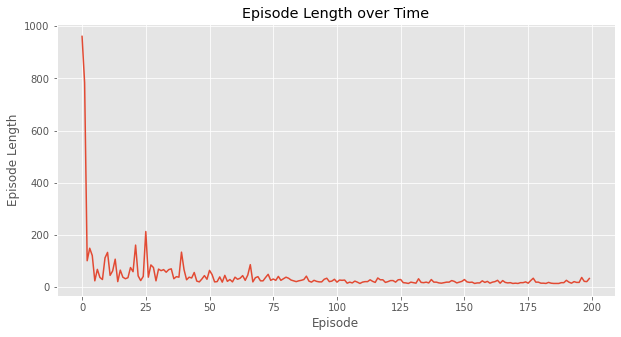

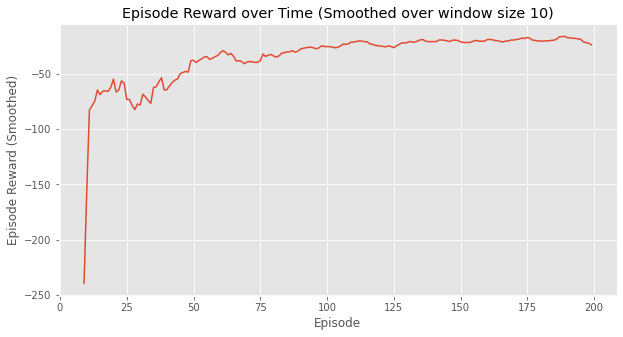

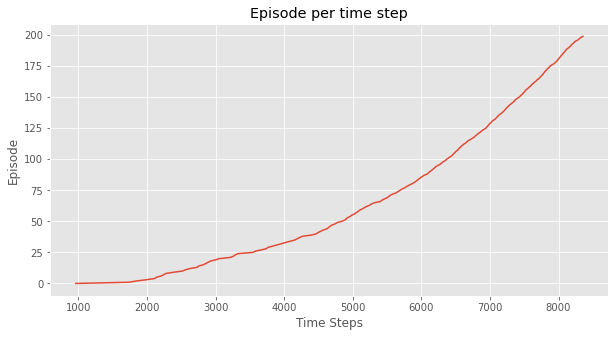

(<Figure size 720x360 with 1 Axes>,
 <Figure size 720x360 with 1 Axes>,
 <Figure size 720x360 with 1 Axes>)

In [9]:
plotting.plot_episode_stats(stats)